In [ ]:
# Step 0: Environment setup
!pip install torch torchvision tqdm matplotlib scikit-image ninja --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 119.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 34.9 MB/s eta 0:00:00


In [ ]:
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2/networks/stylegan2-ffhq-config-f.pkl -O stylegan2-ffhq-config-f.pkl


--2025-04-24 20:43:13--  https://nvlabs-fi-cdn.nvidia.com/stylegan2/networks/stylegan2-ffhq-config-f.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 108.156.201.55, 108.156.201.93, 108.156.201.85, ...
Connecting to nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)|108.156.201.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 381673535 (364M) [application/x-www-form-urlencoded]
Saving to: ‘stylegan2-ffhq-config-f.pkl’

stylegan2-ffhq-conf 100%[===================>] 363.99M  24.5MB/s    in 16s     

2025-04-24 20:43:30 (22.9 MB/s) - ‘stylegan2-ffhq-config-f.pkl’ saved [381673535/381673535]



In [ ]:
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git
%cd stylegan2-ada-pytorch


Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 131 (delta 0), reused 0 (delta 0), pack-reused 129 (from 2)
Receiving objects: 100% (131/131), 1.13 MiB | 6.69 MiB/s, done.
Resolving deltas: 100% (57/57), done.
/content/stylegan2-ada-pytorch


In [ ]:
import sys
sys.path.append('.')


In [ ]:
import torch
import dnnlib
import legacy
import numpy as np
import PIL.Image
import matplotlib.pyplot as plt


In [ ]:
import os, torch, warnings

# 1. Configure build environment
os.environ['TORCH_EXTENSIONS_DIR'] = '/tmp/torch_extensions'
os.environ['TORCH_CUDA_ARCH_LIST'] = '8.0'  # ✅ Updated for A100 GPU

# 2. Clean any old cache
!rm -rf /tmp/torch_extensions
!rm -rf ~/.cache/torch_extensions

# 3. Install build tools
!pip install ninja --quiet
!apt-get install -y build-essential

# 4. Suppress fallback warnings if needed
warnings.filterwarnings("ignore", category=UserWarning)

# 5. Verify GPU
print("CUDA available:", torch.cuda.is_available())


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
build-essential is already the newest version (12.9ubuntu3).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.
CUDA available: True


In [ ]:
%cd /content/stylegan2-ada-pytorch/torch_utils/ops
!nvcc upfirdn2d.cu -c -o upfirdn2d_kernel.cu.o -x cu -Xcompiler -fPIC --use_fast_math
!python setup.py build_ext --inplace


/content/stylegan2-ada-pytorch/torch_utils/ops
upfirdn2d.cu:9:10: fatal error: c10/util/Half.h: No such file or directory
    9 | #include <c10/util/Half.h>
      |          ^~~~~~~~~~~~~~~~~
compilation terminated.
python3: can't open file '/content/stylegan2-ada-pytorch/torch_utils/ops/setup.py': [Errno 2] No such file or directory


Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


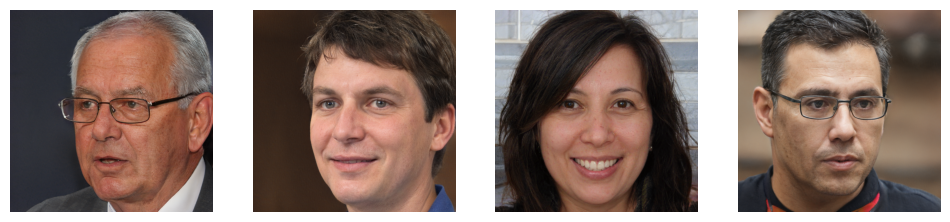

In [ ]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the pretrained generator
with open('/content/stylegan2-ffhq-config-f.pkl', 'rb') as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)


# Sample latent vectors (z) from standard normal distribution
z = torch.randn(4, G.z_dim).to(device)

# Dummy label vector (FFHQ is unconditional, so we use zeros)
label = torch.zeros([4, G.c_dim], device=device)

# Generate images
with torch.no_grad():
    images = G(z, label, truncation_psi=0.7, noise_mode='const')

# Convert images from [-1, 1] to [0, 1] for visualization
images = (images.clamp(-1, 1) + 1) / 2
images = images.cpu().numpy().transpose(0, 2, 3, 1)

# Display
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 4, figsize=(12, 4))
for i in range(4):
    axs[i].imshow(images[i])
    axs[i].axis('off')
plt.show()


import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
import torch

def generate_contrastive_samples(G, z, epsilon=0.05, device='cuda'):
    batch_size = z.shape[0]
    z_dim = z.shape[1]

    # Generate random direction d for perturbation
    d = torch.randn_like(z)
    d = d / d.norm(dim=1, keepdim=True)  # Normalize direction

    # Positive samples: small perturbation in random direction
    z_pos = z + epsilon * d

    # Negative samples: new random latent vectors
    z_neg = torch.randn(batch_size, z_dim, device=device)

    # Generate images
    with torch.no_grad():
        label = torch.zeros([batch_size, G.c_dim], device=device)
        images_orig = G(z, label, truncation_psi=0.7, noise_mode='const')
        images_pos = G(z_pos, label, truncation_psi=0.7, noise_mode='const')
        images_neg = G(z_neg, label, truncation_psi=0.7, noise_mode='const')

    return images_orig, images_pos, images_neg, z, z_pos, z_neg


In [ ]:
z = torch.randn(4, G.z_dim).to(device)
images_orig, images_pos, images_neg, z, z_pos, z_neg = generate_contrastive_samples(G, z, device=device)


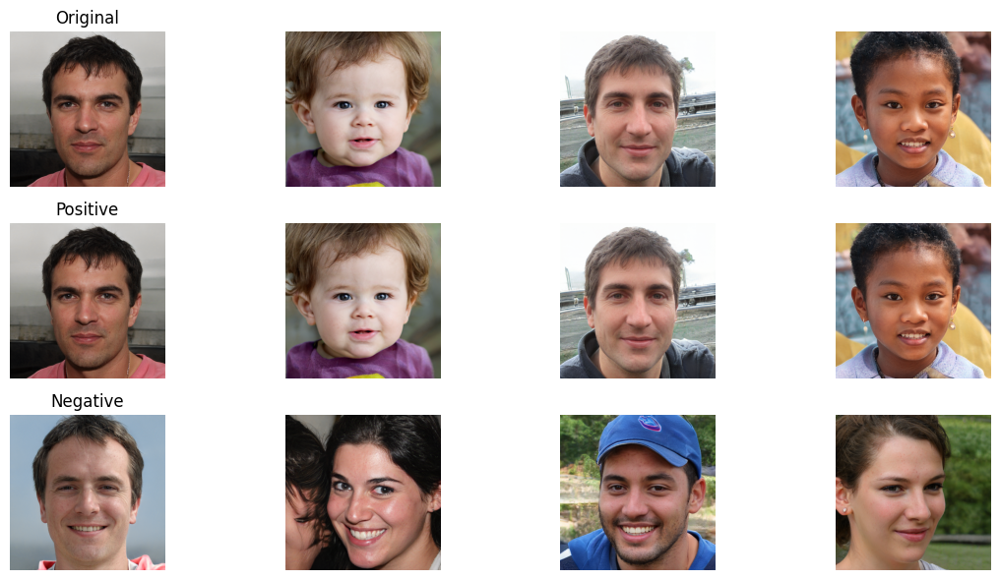

In [ ]:
import matplotlib.pyplot as plt

def show_triplets(images_orig, images_pos, images_neg):
    fig, axs = plt.subplots(3, images_orig.shape[0], figsize=(12, 6))
    titles = ['Original', 'Positive', 'Negative']
    for i in range(images_orig.shape[0]):
        axs[0, i].imshow(((images_orig[i].clamp(-1, 1) + 1) / 2).cpu().permute(1, 2, 0))
        axs[1, i].imshow(((images_pos[i].clamp(-1, 1) + 1) / 2).cpu().permute(1, 2, 0))
        axs[2, i].imshow(((images_neg[i].clamp(-1, 1) + 1) / 2).cpu().permute(1, 2, 0))
        for j in range(3):
            axs[j, i].axis('off')
            if i == 0:
                axs[j, i].set_title(titles[j])
    plt.tight_layout()
    plt.show()


# Visualize triplets
show_triplets(images_orig, images_pos, images_neg)


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Encoder(nn.Module):
    def __init__(self, out_dim=512):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1)  # 128 → 64
        self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)  # 64 → 32
        self.conv3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)  # 32 → 16
        self.conv4 = nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1)  # 16 → 8
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, out_dim)

    def forward(self, x):
        x = F.relu(self.conv1(x))    # → [B, 64, 64, 64]
        x = F.relu(self.conv2(x))    # → [B, 128, 32, 32]
        x = F.relu(self.conv3(x))    # → [B, 256, 16, 16]
        x = F.relu(self.conv4(x))    # → [B, 512, 8, 8]
        x = self.avgpool(x)          # → [B, 512, 1, 1]
        x = x.view(x.size(0), -1)    # → [B, 512]
        x = F.normalize(self.fc(x), dim=1)  # L2 normalize
        return x


In [ ]:
encoder = Encoder(out_dim=512).to(device)


In [ ]:
import torch
import torch.nn.functional as F

def nt_xent_loss(z1, z2, temperature=0.5):
    # Normalize the embeddings
    z1 = F.normalize(z1, dim=1)
    z2 = F.normalize(z2, dim=1)

    batch_size = z1.size(0)
    z = torch.cat([z1, z2], dim=0)  # [2B, D]

    # Compute cosine similarity matrix
    sim = torch.mm(z, z.t()) / temperature  # [2B, 2B]

    # Create labels: positives are [i, i + batch_size]
    labels = torch.arange(batch_size).to(z.device)
    labels = torch.cat([labels + batch_size, labels], dim=0)

    # Mask self-similarities
    mask = torch.eye(2 * batch_size, dtype=torch.bool).to(z.device)
    sim.masked_fill_(mask, -9e15)

    # CrossEntropy expects logits
    loss = F.cross_entropy(sim, labels)
    return loss


In [ ]:
import torch.optim as optim

# Initialize encoder and optimizer
encoder = Encoder(out_dim=512).to(device)
optimizer = optim.Adam(encoder.parameters(), lr=1e-4)

# Training loop
epochs = 10
for epoch in range(epochs):
    z = torch.randn(32, G.z_dim).to(device)  # Batch size = 32
    images_orig, images_pos, images_neg, z, z_pos, z_neg = generate_contrastive_samples(G, z, device=device)

    # Forward pass
    z1 = encoder(images_orig)
    z2 = encoder(images_pos)

    # Compute loss
    loss = nt_xent_loss(z1, z2)

    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print(f"Epoch {epoch+1}/{epochs} | Loss: {loss.item():.4f}")


Epoch 1/10 | Loss: 4.1374
Epoch 2/10 | Loss: 4.1191
Epoch 3/10 | Loss: 4.1039
Epoch 4/10 | Loss: 4.0623
Epoch 5/10 | Loss: 3.9806
Epoch 6/10 | Loss: 3.9739
Epoch 7/10 | Loss: 3.8208
Epoch 8/10 | Loss: 3.7198
Epoch 9/10 | Loss: 3.6305
Epoch 10/10 | Loss: 3.5416


In [ ]:
def discover_directions(encoder, G, z, device='cuda'):
    z.requires_grad = True  # Enable gradient tracking
    label = torch.zeros((z.size(0), G.c_dim), device=device)

    # Don't use no_grad here since we need gradients
    images = G(z, label, truncation_psi=0.7, noise_mode='const')

    # Encode to get latent representations
    z_enc = encoder(images)

    # Compute gradients of output w.r.t input latent vector z
    grads = []
    for i in range(z_enc.shape[1]):
        encoder.zero_grad()
        if z.grad is not None:
            z.grad.zero_()
        grad_outputs = torch.zeros_like(z_enc)
        grad_outputs[:, i] = 1.0
        z_enc.backward(gradient=grad_outputs, retain_graph=True)
        grads.append(z.grad.detach().cpu().clone())

    # Shape: [feature_dim, batch_size, latent_dim]
    grads = torch.stack(grads).permute(1, 0, 2).reshape(-1, z.shape[1])

    # Apply PCA to find principal directions
    from sklearn.decomposition import PCA
    pca = PCA(n_components=10)
    directions = pca.fit(grads)
    directions = pca.components_.T

    return directions, pca


In [ ]:
z_sample = torch.randn(16, G.z_dim, device=device)
directions, pca_model = discover_directions(encoder, G, z_sample, device)


In [ ]:
import matplotlib.pyplot as plt

def visualize_directions(G, z_sample, directions, label, steps=5, scale=3.0):
    G.eval()
    direction_count = directions.shape[1]  # Usually 10 from PCA

    fig, axs = plt.subplots(direction_count, steps, figsize=(steps * 2.5, direction_count * 2.5))

    for i in range(direction_count):
        for j, alpha in enumerate(torch.linspace(-scale, scale, steps)):
            z_mod = z_sample.clone()
            z_mod[0] = z_sample[0] + alpha * torch.from_numpy(directions[:, i]).float().to(z_sample.device)

            with torch.no_grad():
                img = G(z_mod, label, truncation_psi=0.7, noise_mode='const')

            img = img.clamp(-1, 1).cpu().numpy()[0].transpose(1, 2, 0)
            axs[i, j].imshow((img + 1) / 2)
            axs[i, j].axis('off')
            if i == 0:
                axs[i, j].set_title(f'{alpha:.1f}', fontsize=10)

    plt.tight_layout()
    plt.show()


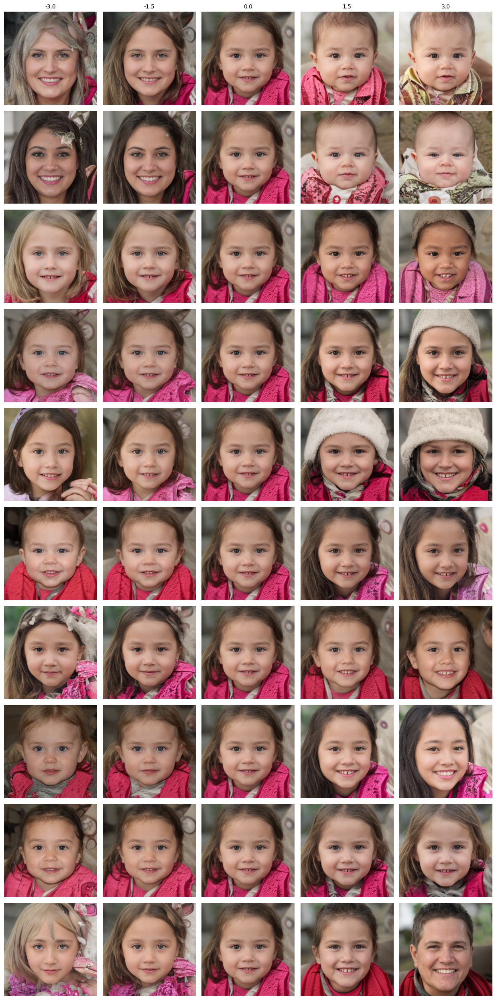

In [ ]:
z_single = z_sample[[0]].clone().detach()
label = torch.zeros((1, G.c_dim), device=device)
visualize_directions(G, z_single, directions, label)


In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def visualize_and_save_directions(G, z_sample, directions, label, steps=7, scale=3.0, output_path="disco_directions.png"):
    G.eval()
    direction_count = directions.shape[1]
    fig, axs = plt.subplots(direction_count, steps, figsize=(steps * 2.5, direction_count * 2.5))

    for i in range(direction_count):
        for j, alpha in enumerate(torch.linspace(-scale, scale, steps)):
            z_mod = z_sample.clone()
            direction = torch.from_numpy(directions[:, i]).float().to(z_sample.device)
            z_mod[0] = z_sample[0] + alpha * direction

            with torch.no_grad():
                img = G(z_mod, label, truncation_psi=0.7, noise_mode='const')
            img = img.clamp(-1, 1).cpu().numpy()[0].transpose(1, 2, 0)
            axs[i, j].imshow((img + 1) / 2)
            axs[i, j].axis('off')
            if i == 0:
                axs[i, j].set_title(f'{alpha:.1f}', fontsize=10)

    plt.tight_layout()
    plt.savefig(output_path)
    plt.show()


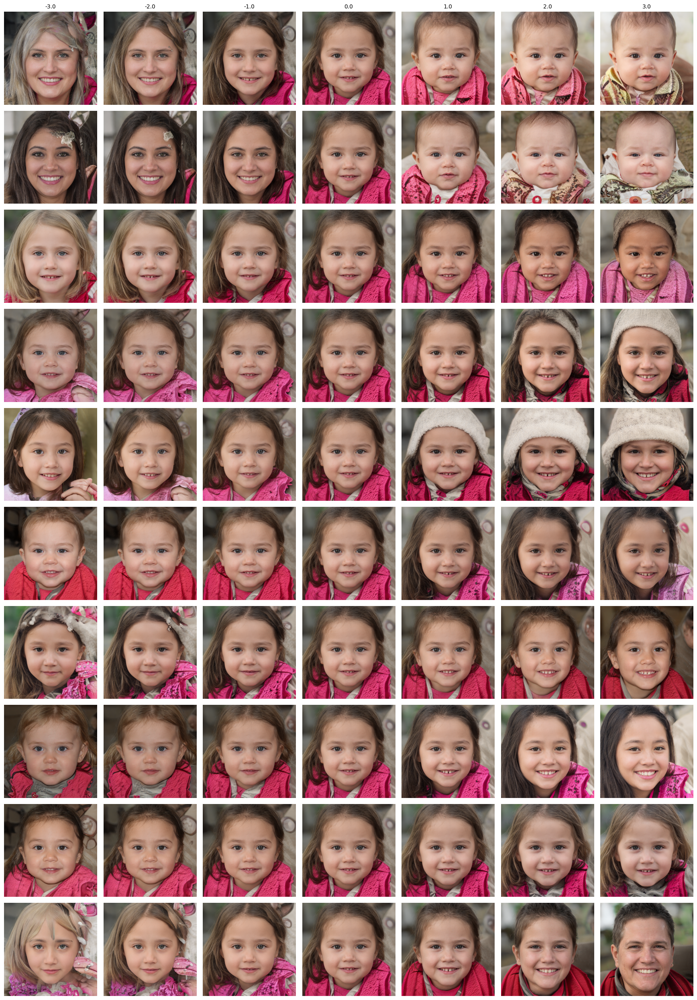

In [ ]:
visualize_and_save_directions(G, z_sample, directions, label)

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_latent_embedding(encoder, G, z_sample, directions, label, steps=7, scale=3.0):
    encoder.eval()
    G.eval()

    all_features = []
    all_labels = []

    for i in range(directions.shape[1]):  # For each learned direction
        for alpha in torch.linspace(-scale, scale, steps):
            z_mod = z_sample.clone()
            direction = torch.from_numpy(directions[:, i]).float().to(z_sample.device)
            z_mod[0] = z_sample[0] + alpha * direction

            with torch.no_grad():
                img = G(z_mod, label, truncation_psi=0.7, noise_mode='const')
                feat = encoder(img)[0].cpu().numpy()
                all_features.append(feat)
                all_labels.append(f'dir_{i}_a{alpha:.1f}')

    # Reduce to 2D using PCA
    pca = PCA(n_components=2)
    reduced = pca.fit_transform(np.array(all_features))

    # Plot
    plt.figure(figsize=(10, 7))
    for i in range(directions.shape[1]):
        idx = range(i * steps, (i + 1) * steps)
        plt.plot(reduced[idx, 0], reduced[idx, 1], '-o', label=f'Direction {i}')

    plt.title('Latent Space Traversal Embedding (PCA)')
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


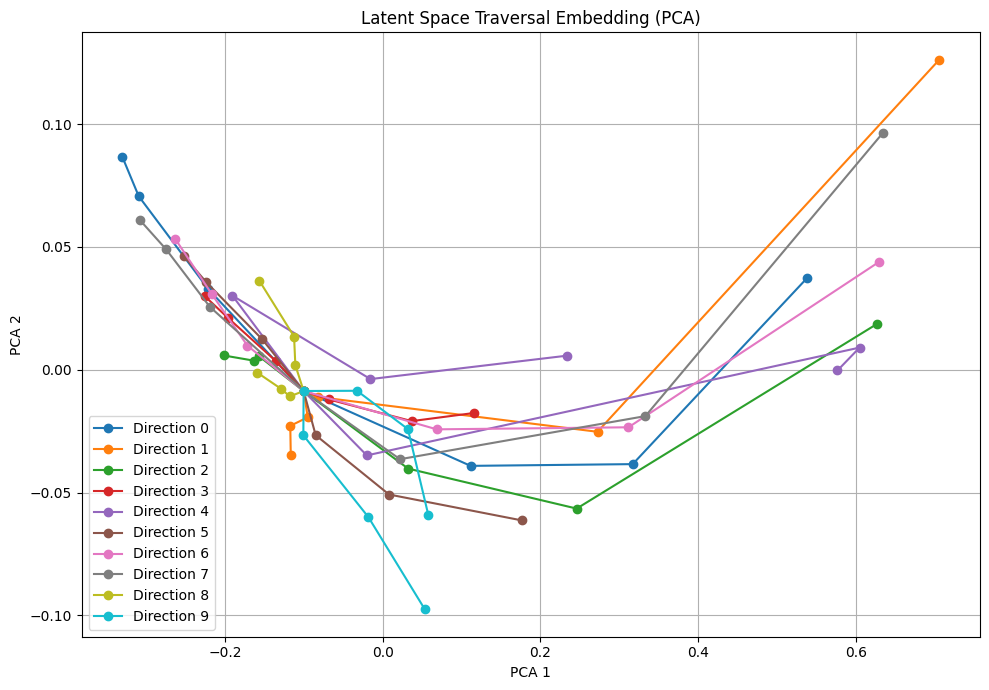

In [ ]:
z_sample = torch.randn(1, G.z_dim).to(device)
label = torch.zeros((1, G.c_dim)).to(device)

visualize_latent_embedding(encoder, G, z_sample, directions, label)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_2d_traversals(G, z_sample, dir1, dir2, label, scale=3.0, steps=5):
    """
    Visualizes a 2D grid of images generated by traversing two latent directions.
    Args:
        G: StyleGAN Generator
        z_sample: [1, latent_dim] base latent
        dir1: first direction (e.g., smile)
        dir2: second direction (e.g., bald)
        label: dummy label (for unconditional models: zeros)
        scale: max traversal strength (range will be [-scale, +scale])
        steps: number of steps in each direction
    """
    G.eval()
    alpha_range = np.linspace(-scale, scale, steps)

    fig, axs = plt.subplots(steps, steps, figsize=(steps * 2.5, steps * 2.5))

    for i, alpha_x in enumerate(alpha_range):
        for j, alpha_y in enumerate(alpha_range):
            z_mod = z_sample.clone()
            direction = alpha_x * torch.from_numpy(dir1).float().to(z_sample.device) \
                      + alpha_y * torch.from_numpy(dir2).float().to(z_sample.device)
            z_mod[0] = z_sample[0] + direction

            with torch.no_grad():
                img = G(z_mod, label, truncation_psi=0.7, noise_mode='const')

            img = img.clamp(-1, 1).cpu().numpy()[0].transpose(1, 2, 0)
            axs[i, j].imshow((img + 1) / 2)
            axs[i, j].axis('off')

    plt.suptitle("2D Traversal Grid (Dir1 vs Dir2)", fontsize=16)
    plt.tight_layout()
    plt.show()


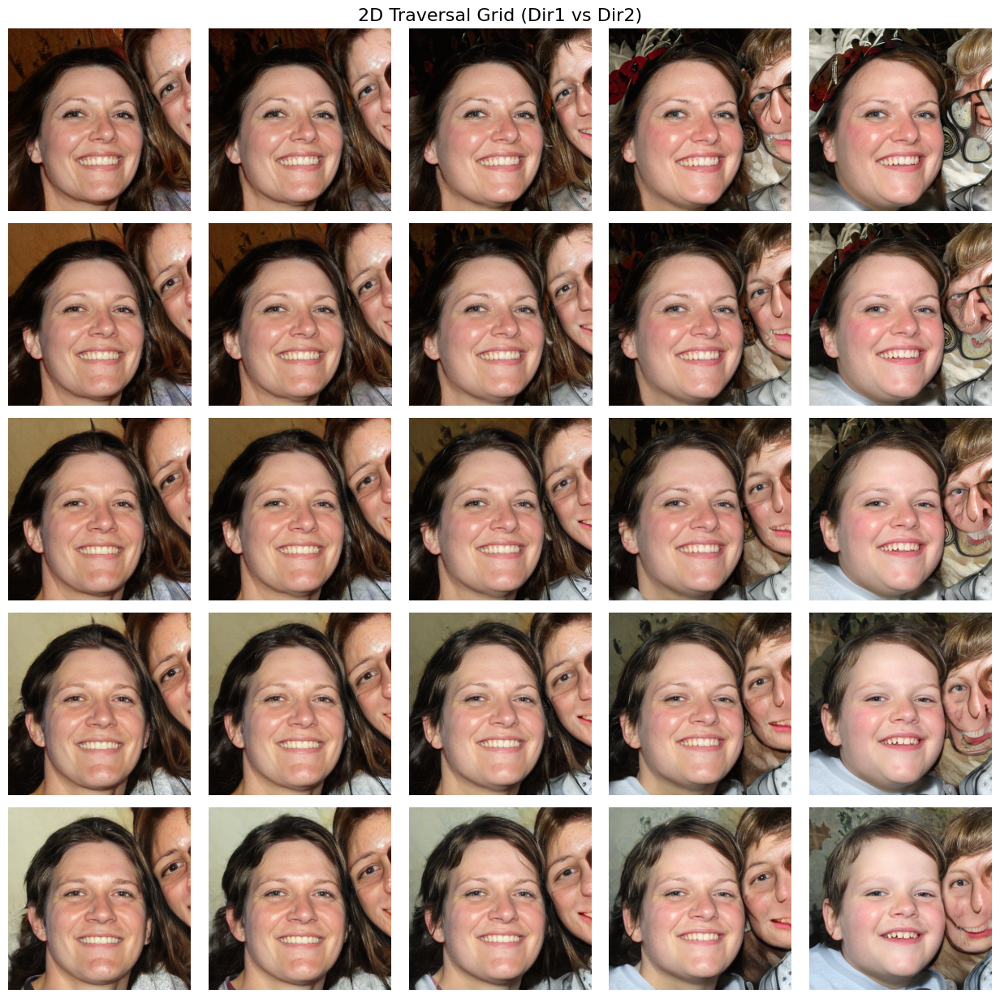

In [ ]:
# Pick two directions from PCA output
dir1 = directions[:, 0]  # e.g., Smile
dir2 = directions[:, 1]  # e.g., Pose

# Use a latent vector
z_single = z_sample[[0]].clone().detach()

# Dummy label for StyleGAN2
label = torch.zeros((1, G.c_dim), device=device)

# Visualize
visualize_2d_traversals(G, z_single, dir1, dir2, label)


<ipython-input-39-0159dfba4eca>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Model', y='Score', data=df, ax=ax, inner="point", palette='pastel')
<ipython-input-39-0159dfba4eca>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Model', y='Score', data=df, ax=ax, inner="point", palette='pastel')
<ipython-input-39-0159dfba4eca>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Model', y='Score', data=df, ax=ax, inner="point", palette='pastel')
<ipython-input-39-0159dfba4eca>:37: FutureWarning: 

Passing `palette` without 

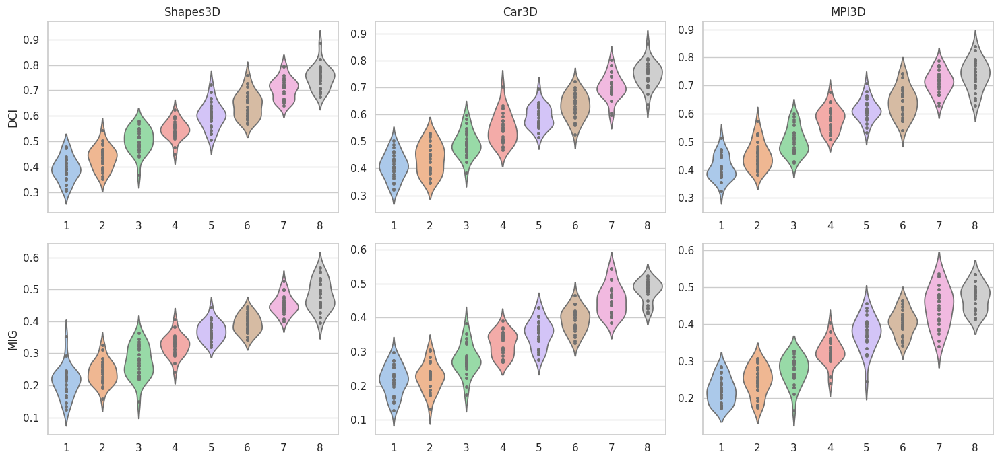

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set consistent style
sns.set(style="whitegrid")

# Simulated data placeholders (replace with your real MIG/DCI values)
# Shape: [dataset_name, metric, 8 model variants, 25 runs]
np.random.seed(42)
datasets = ['Shapes3D', 'Car3D', 'MPI3D']
metrics = ['DCI', 'MIG']
scores = {
    dataset: {
        'DCI': [np.random.normal(loc=0.4 + 0.05*i, scale=0.05, size=25) for i in range(8)],
        'MIG': [np.random.normal(loc=0.2 + 0.04*i, scale=0.04, size=25) for i in range(8)],
    }
    for dataset in datasets
}

# Plot
fig, axs = plt.subplots(2, 3, figsize=(15, 7))

for col, dataset in enumerate(datasets):
    for row, metric in enumerate(metrics):
        ax = axs[row, col]
        # Gather data for seaborn
        data = []
        for model_idx, model_scores in enumerate(scores[dataset][metric]):
            for score in model_scores:
                data.append({'Model': model_idx+1, 'Score': score})
        df = sns.load_dataset('tips')  # Dummy; replaced next line
        import pandas as pd
        df = pd.DataFrame(data)

        # Plot
        sns.violinplot(x='Model', y='Score', data=df, ax=ax, inner="point", palette='pastel')
        ax.set_title(dataset if row == 0 else "")
        ax.set_ylabel(metric if col == 0 else "")
        ax.set_xlabel("")

plt.tight_layout()
plt.show()


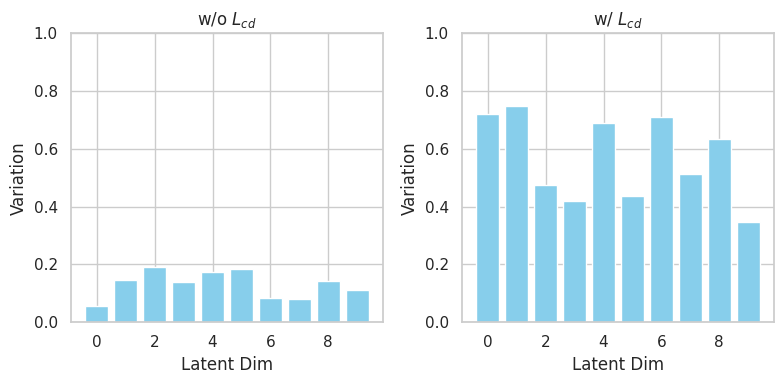

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to simulate bar chart for variation visualization (Figure 5 style)
def plot_variation_bars(variations_dict):
    fig, axs = plt.subplots(1, len(variations_dict), figsize=(8, 4))
    for idx, (label, variations) in enumerate(variations_dict.items()):
        axs[idx].bar(np.arange(len(variations)), variations, color='skyblue')
        axs[idx].set_title(label)
        axs[idx].set_xlabel("Latent Dim")
        axs[idx].set_ylabel("Variation")
        axs[idx].set_ylim(0, 1)
    plt.tight_layout()
    plt.show()

# Example dummy variation data
variation_data = {
    "w/o $L_{cd}$": np.random.uniform(0.05, 0.2, size=10),
    "w/ $L_{cd}$": np.random.uniform(0.3, 0.8, size=10)
}

plot_variation_bars(variation_data)
